In [1]:
import json
import matplotlib.pyplot as plt
from datetime import datetime
from collections import defaultdict
import os
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

In [2]:
directories = os.listdir()
data_path = [dir for dir in directories if dir.startswith("data")][0]


In [3]:
# import os
# import json

# def remove_nameof_feature_from_json(file_path):
#     with open(file_path, 'r', encoding='utf-8') as f:
#         data = json.load(f)

#     repo = next(iter(data))
#     commits = data[repo]

#     for commit in commits:
#         for version_result in commit.get("ResultsPerVersion", []):
#             values = version_result.get("Values", {})
#             if "auto-default structs" in values:
#                 del values["auto-default structs"]

#     with open(file_path, 'w', encoding='utf-8') as f:
#         json.dump(data, f, indent=2)

#     print(f"✅ Cleaned: {os.path.basename(file_path)}")


# file_path = "data"
# folder_path = "data/"

# for fname in os.listdir(folder_path):
#     if fname.endswith(".json"):
#         remove_nameof_feature_from_json(os.path.join(folder_path, fname))

Load modernity signatures and create dataframe

In [4]:
def extract_all_features(folder_path):
    files = [f for f in os.listdir(folder_path) if f.endswith('.json')]
    #print(f"Found {len(files)} JSON files in {folder_path}.")
    records = []
    for file in files:
        with open(os.path.join(folder_path, file), 'r') as f:
            json_file = json.load(f)
            
            repo_name = next(iter(json_file))  # Get the first key as repository name
            #print(f"Processing file: {file} for repository: {repo_name}")
            list_of_commits = next(iter(json_file.values()))
            #agregated_results = 
            for commit in list_of_commits:
                #print(f"Processing commit {list_of_commits.index(commit)+1} at date {commit['Date']}")
                row = {"Date": commit['Date'], 
                       "Repository": repo_name}
                
                
                results_per_version = commit['ResultsPerVersion']
                for version in results_per_version:
                    version_nr = version['Version']
                    values = version['Values']
                    total_usage = sum(values.values())
                    
                    row[version['Version']] = total_usage
                    #print(f"Total usage in version {version_nr} is {total_usage}.")
                
                records.append(row)
                
    return records


versions_ = [ "7.1", "7.2", "7.3", "8", "9", "10", "11", "12"]

df = extract_all_features(data_path)
df = pd.DataFrame(df)

df_binary = extract_all_features(data_path)
df_binary = pd.DataFrame(df)


df.to_csv("aggregated_results.csv", index=False)
print(df.head(10))
df.to_csv("Test.csv", index=False)
df_binary.columns = df_binary.columns.astype(str).str.strip()
df_binary[versions_] = (df_binary[versions_]>0).astype(int)  # Convert to binary presence/absence
print(df_binary.head(10))

         Date Repository  7.1  7.2  7.3   8  9  10  11  12
0  20-03-2020    1Remote    0    0    6  31  3   0   0   0
1  28-03-2020    1Remote    0    0   16  35  4   0   0   0
2  12-04-2020    1Remote    2    0   44  36  0   0   0   0
3  20-04-2020    1Remote    3    0   47  36  0   0   0   0
4  04-05-2020    1Remote    4    0   52  54  0   0   0   0
5  07-05-2020    1Remote    5    0   73  57  0   0   0   0
6  14-05-2020    1Remote   11    0  110  71  0   0   0   0
7  20-05-2020    1Remote   15    0  134  73  0   0   0   0
8  15-06-2020    1Remote   17    0  143  82  0   0   0   0
9  01-07-2020    1Remote   21    0  156  82  0   0   0   0
         Date Repository  7.1  7.2  7.3  8  9  10  11  12
0  20-03-2020    1Remote    0    0    1  1  1   0   0   0
1  28-03-2020    1Remote    0    0    1  1  1   0   0   0
2  12-04-2020    1Remote    1    0    1  1  0   0   0   0
3  20-04-2020    1Remote    1    0    1  1  0   0   0   0
4  04-05-2020    1Remote    1    0    1  1  0   0   0   0
5  

Similarity heat-map

   YearMonth  RepoCount
0    2019-01         59
1    2019-02         54
2    2019-03         56
3    2019-04         67
4    2019-05         52
..       ...        ...
72   2025-01         57
73   2025-02         57
74   2025-03         53
75   2025-04         56
76   2025-05         51

[77 rows x 2 columns]


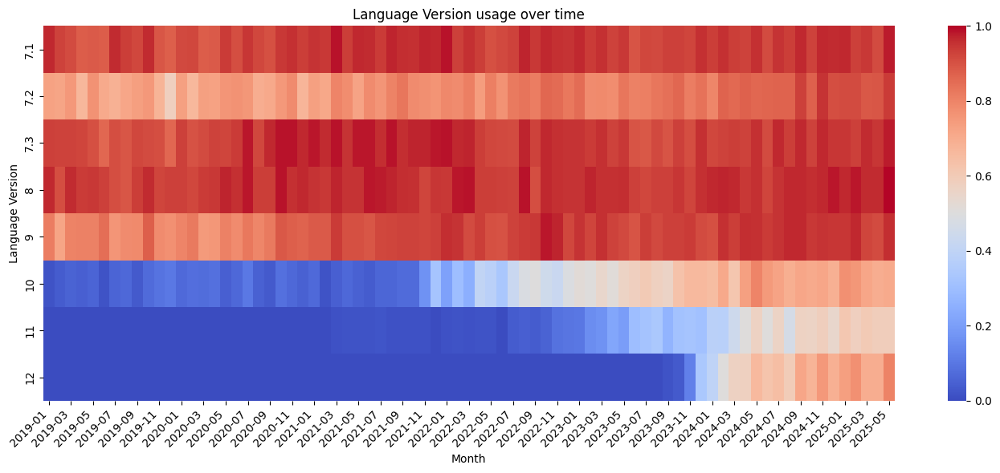

In [8]:
release_dates = {
    "11": pd.to_datetime("2022-11-08"),
    "12": pd.to_datetime("2023-11-14"),
}



df_binary["Date"] = pd.to_datetime(df_binary["Date"], dayfirst=True)
df_binary["YearMonth"] = df_binary["Date"].dt.to_period("M")

df_monthly = df_binary.sort_values(by="Date").groupby(["Repository", "YearMonth"]).tail(1).reset_index(drop=True)


df_monthly = df_monthly.sort_values(by=["Repository","Date"]).reset_index(drop=True)

df_monthly["Date"]= pd.to_datetime(df_monthly["Date"], dayfirst=True) #Convert date to proper datetime

df_monthly["Padding"] = 0 #Add the padding as 0 to existent columns, so when I add the new columns they will be aligned

df_monthly = df_monthly.set_index(["Repository","YearMonth"])

all_months = pd.period_range(start = df_monthly.index.get_level_values("YearMonth").min(),
                             end = df_monthly.index.get_level_values("YearMonth").max(),
                             freq='M')

repos = df_monthly.index.get_level_values("Repository").unique()

full_index = pd.MultiIndex.from_product([repos, all_months], names=["Repository", "YearMonth"])
df_monthly = df_monthly.reindex(full_index)
df_monthly["Padding"] = df_monthly["Padding"].fillna(1)  # Fill NaN values with 0

df_monthly[versions_] = df_monthly[versions_].fillna(0)  # Fill NaN values with 0 for versions

df_monthly = df_monthly.reset_index().sort_values(by=["Repository", "YearMonth"]).reset_index(drop=True)

df_monthly.to_csv("monthly_results.csv", index=True)
df_monthly = df_monthly[df_monthly["YearMonth"] >= pd.Period("2019-01", freq="M")]

monthly_repo_counts = (
    df_monthly[df_monthly["Padding"] == 0]
    .groupby("YearMonth")["Repository"]
    .nunique()
    .reset_index(name="RepoCount")
)
monthly_repo_counts.to_csv("monthly_repo_counts.csv", index=False)
print(monthly_repo_counts)


real_data = df_monthly[df_monthly["Padding"] == 0]

heatmap_data = (
    real_data.groupby("YearMonth")[versions_]
    .mean()
    .T
)

plt.figure(figsize=(14, 6))
sns.heatmap(
    heatmap_data, 
    cmap="coolwarm", 
    annot=False, 
    fmt=".2f",
    annot_kws={"size": 6})
plt.title("Language Version usage over time")
plt.xlabel("Month")
plt.ylabel("Language Version")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()



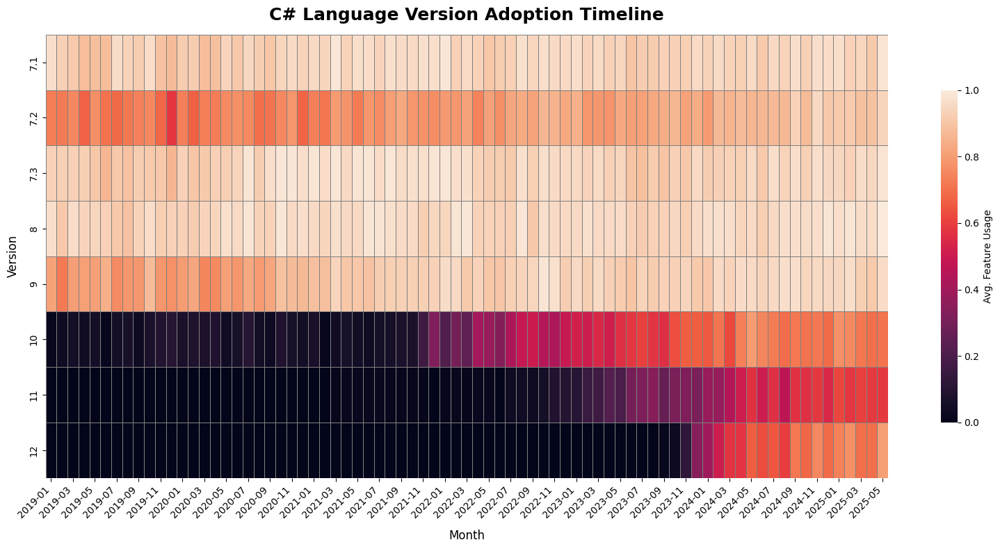

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 8))

sns.heatmap(
    heatmap_data,
    cmap="rocket",               # 🔴 high-contrast dark-to-light red
    linewidths=0.6,
    linecolor="gray",
    cbar_kws={
        "shrink": 0.75,
        "label": "Avg. Feature Usage",
        "orientation": "vertical"
    },
    square=False,
    annot=False
)

plt.title("C# Language Version Adoption Timeline", fontsize=18, fontweight='bold', pad=15)
plt.xlabel("Month", fontsize=12, labelpad=10)
plt.ylabel("Version", fontsize=12, labelpad=10)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)

plt.grid(False)
plt.tight_layout()
plt.show()


Initial plots


           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:6: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['Date'] = pd.to_datetime(df['Date'])
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


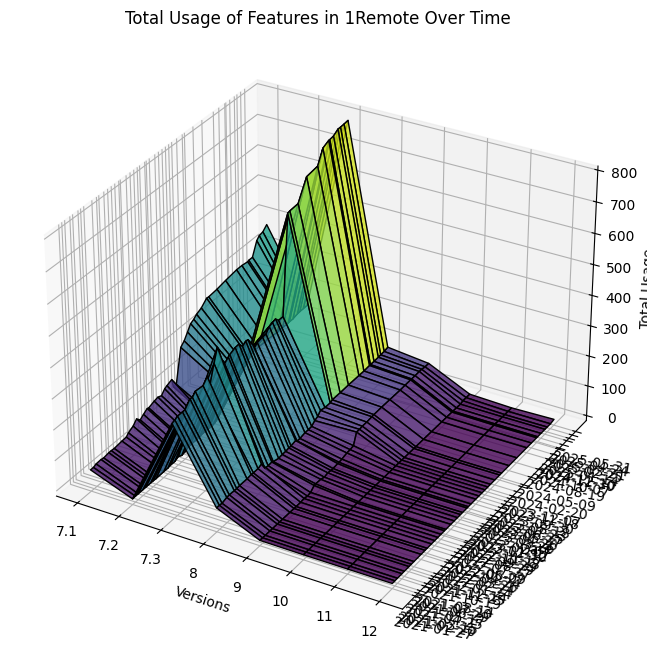

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())


           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


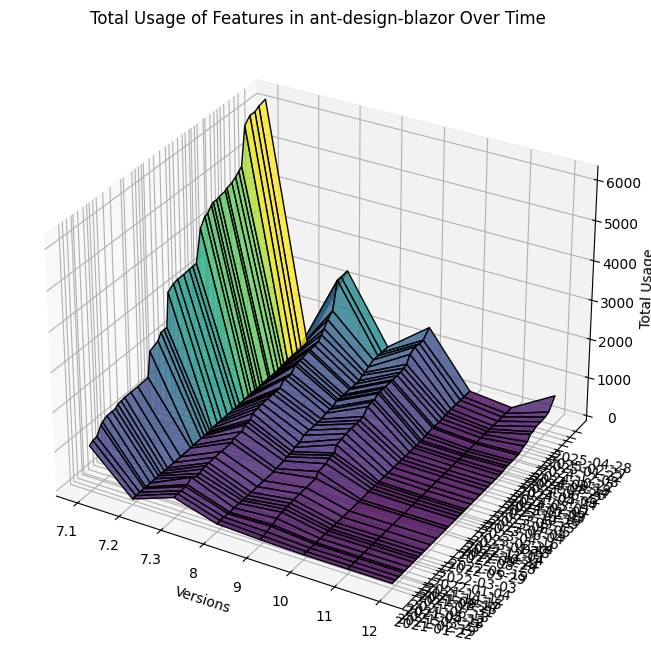

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


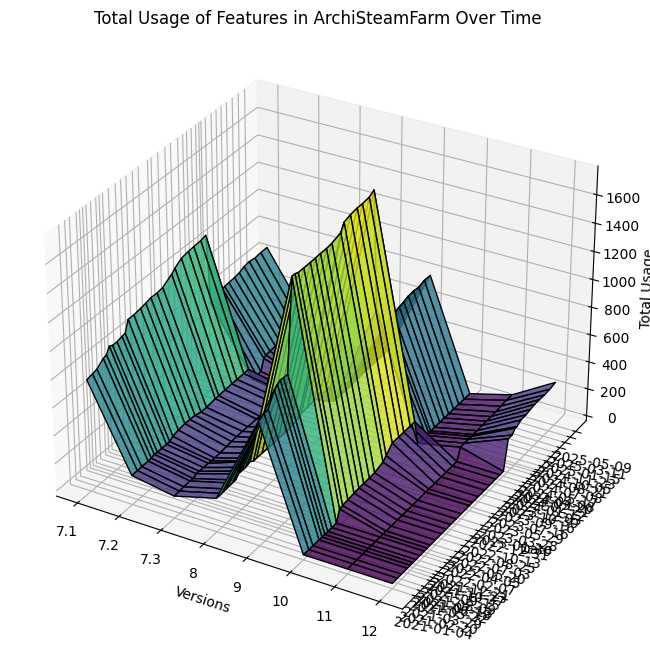

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


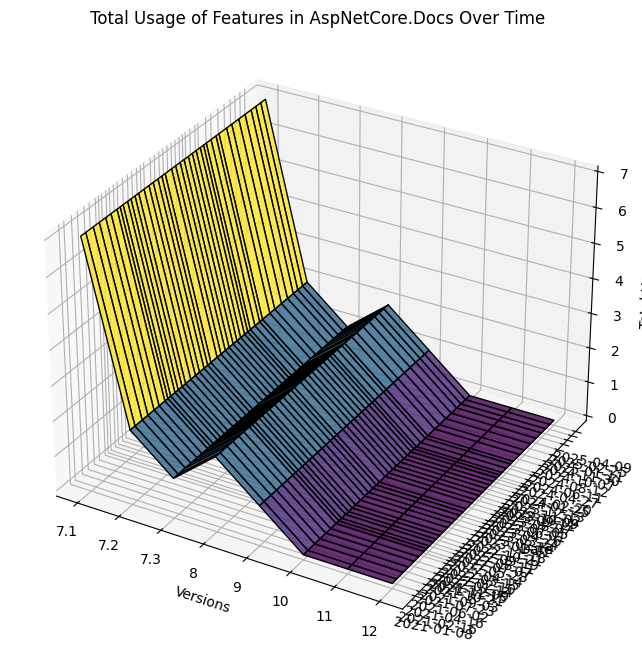

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


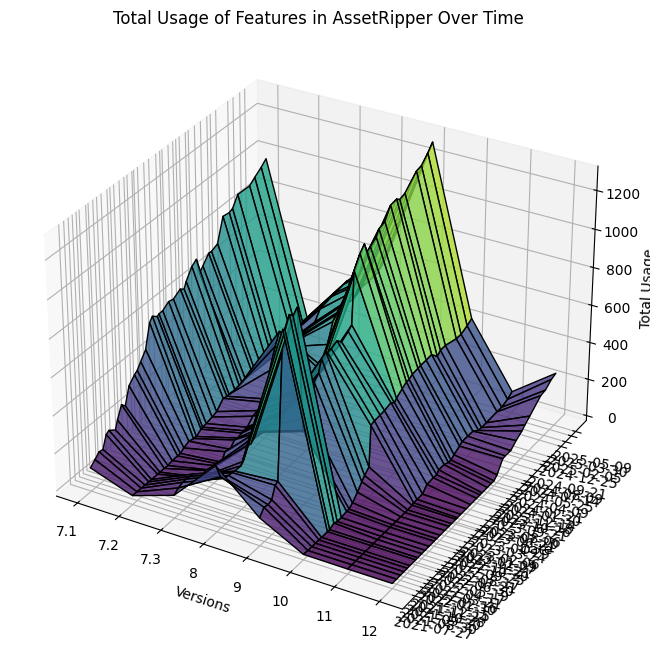

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


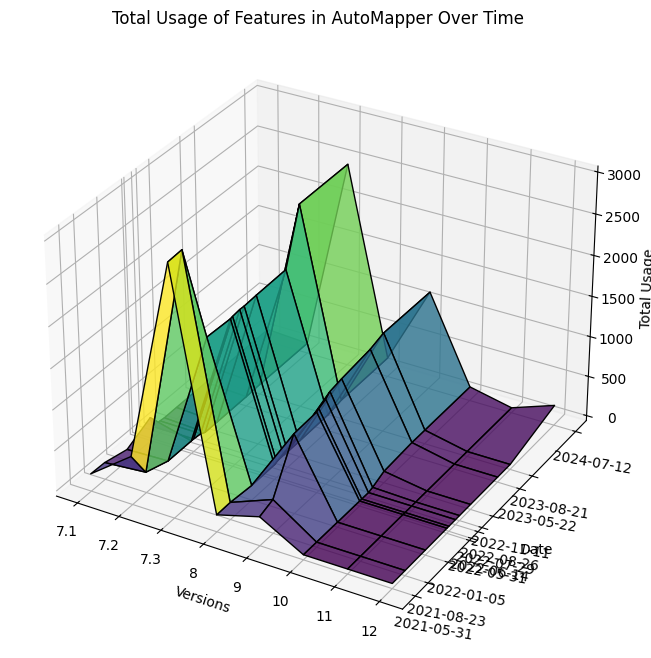

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


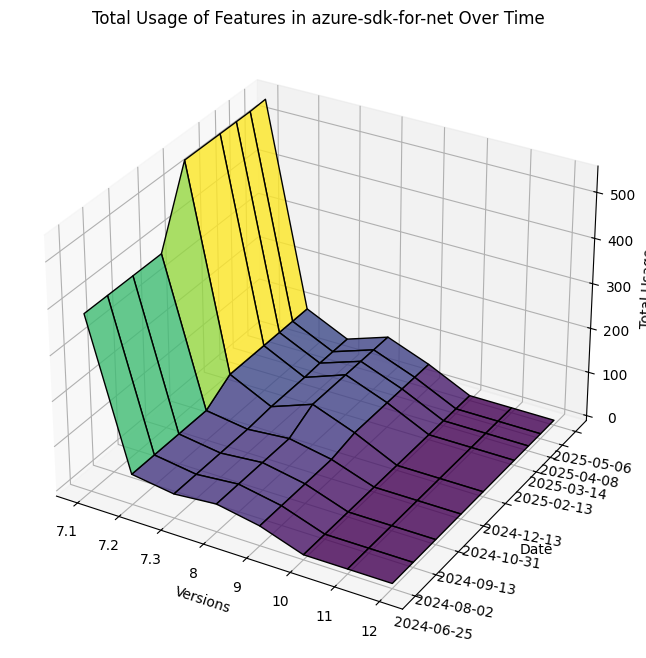

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


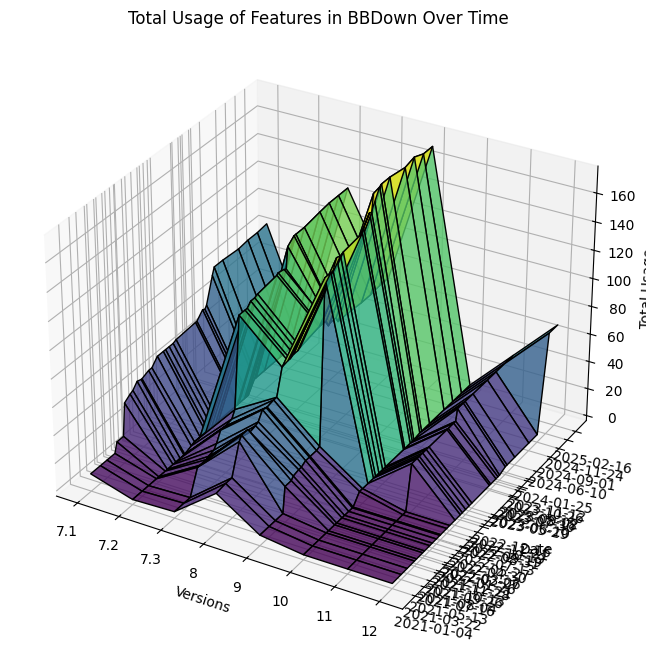

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


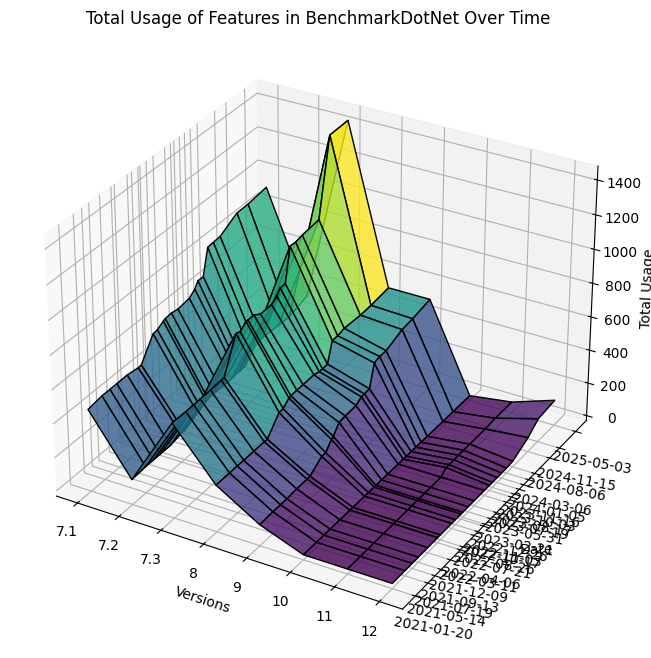

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


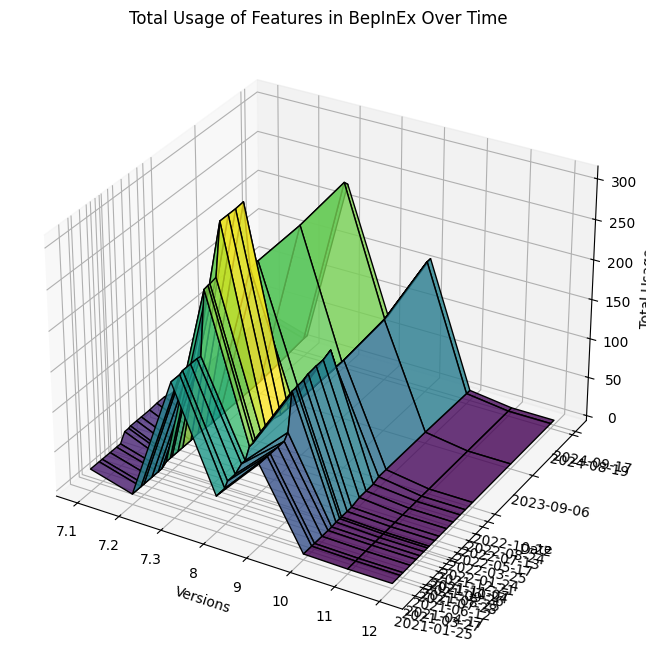

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


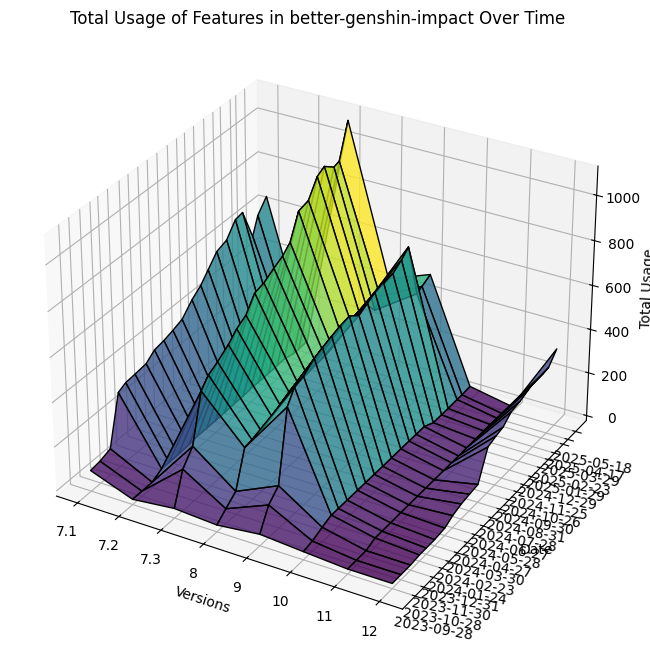

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


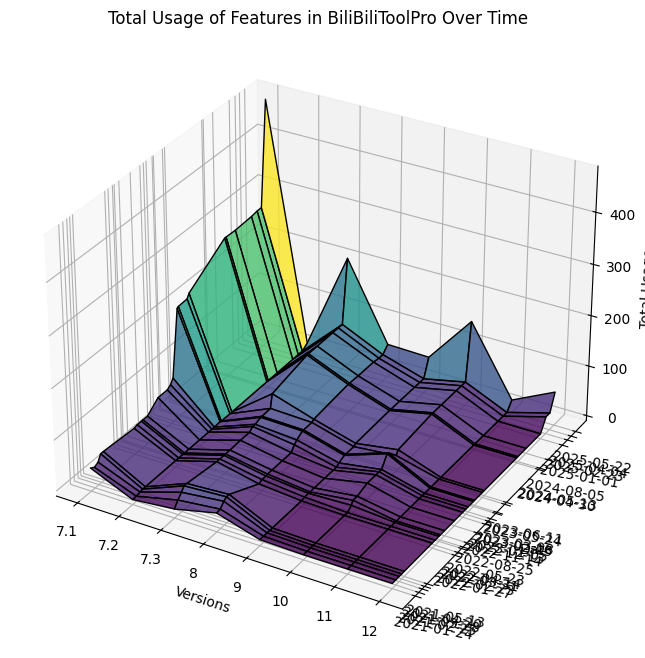

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


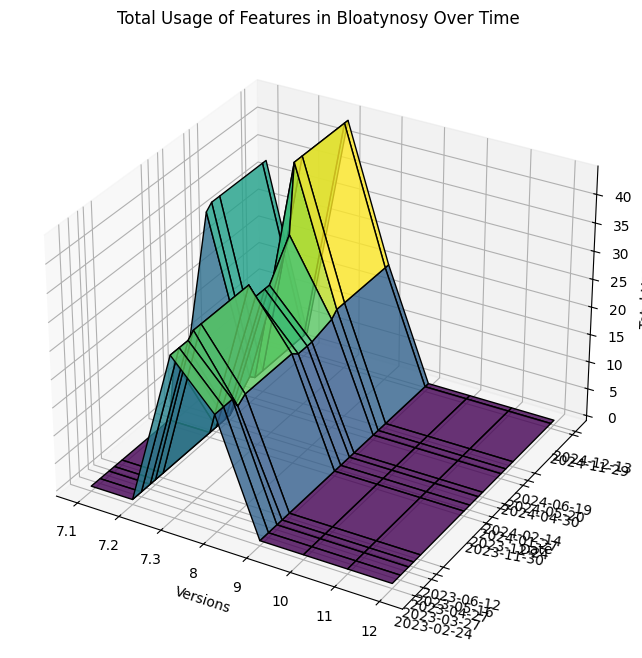

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


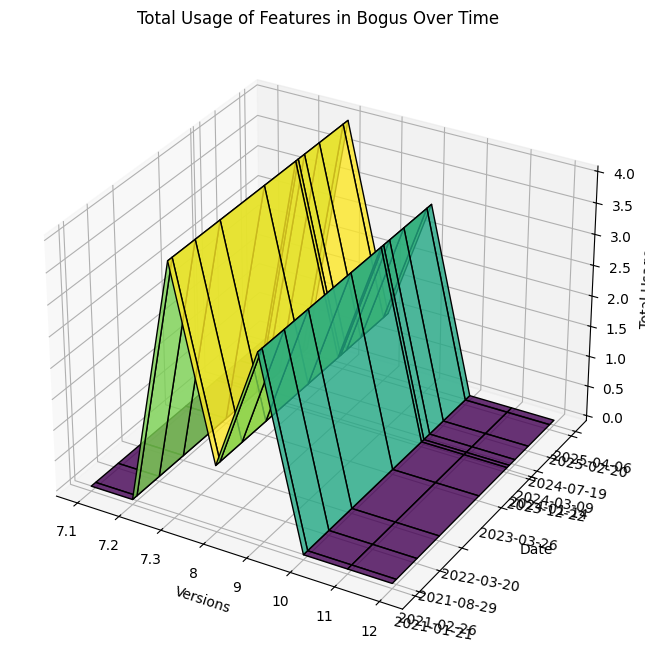

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())


C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


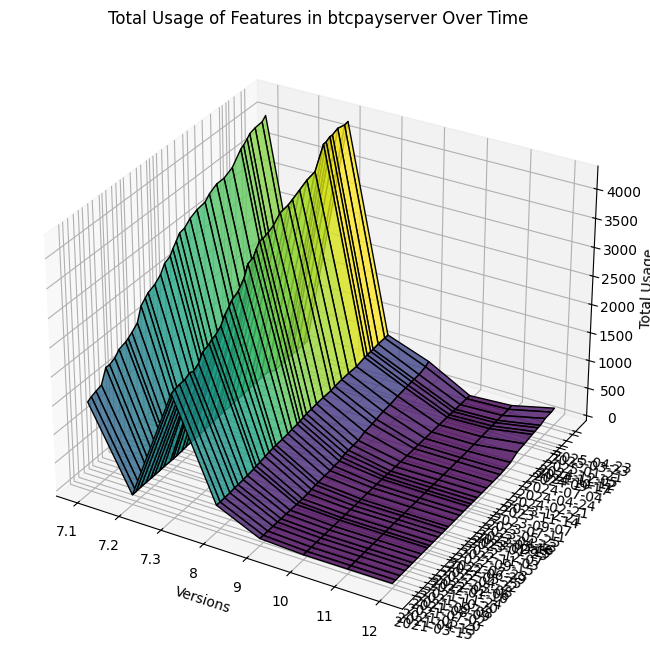

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


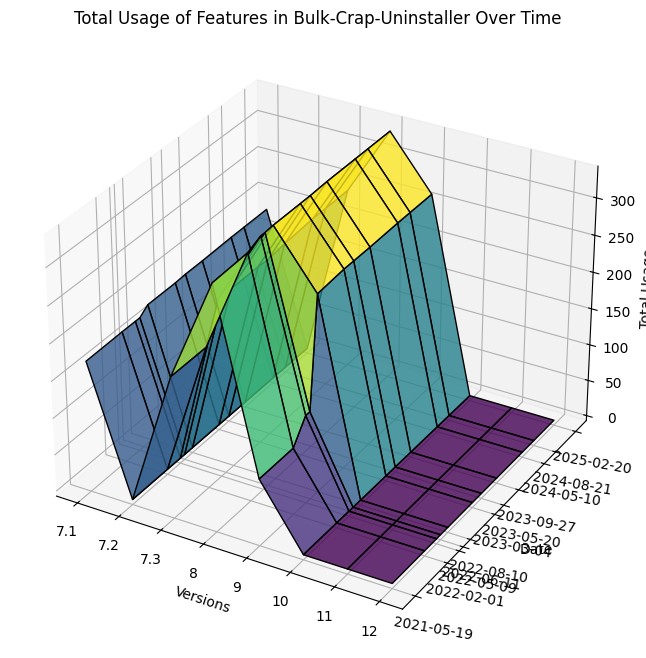

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


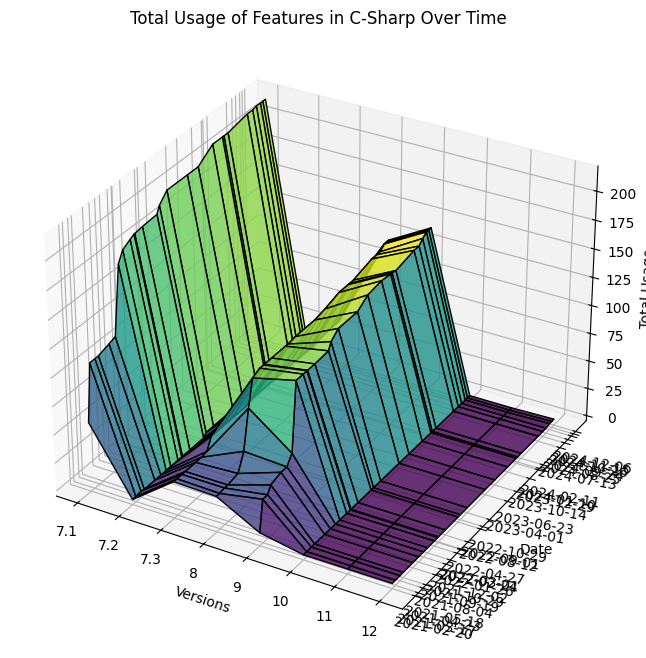

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


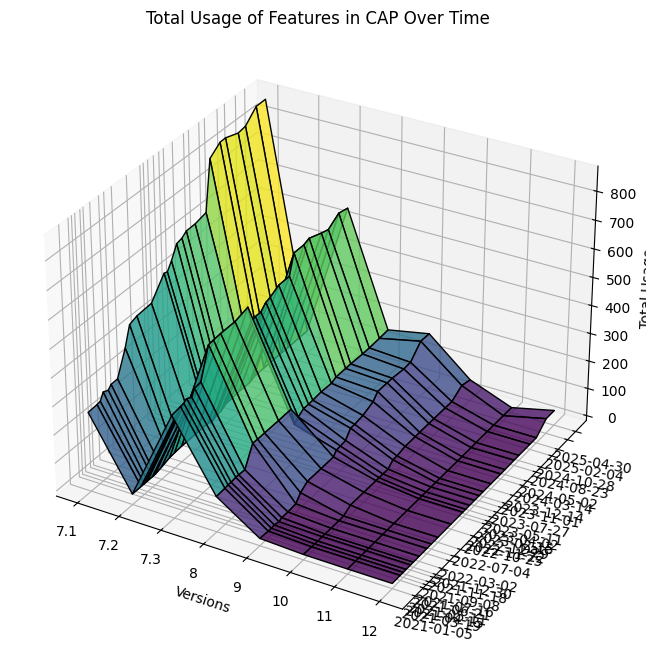

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


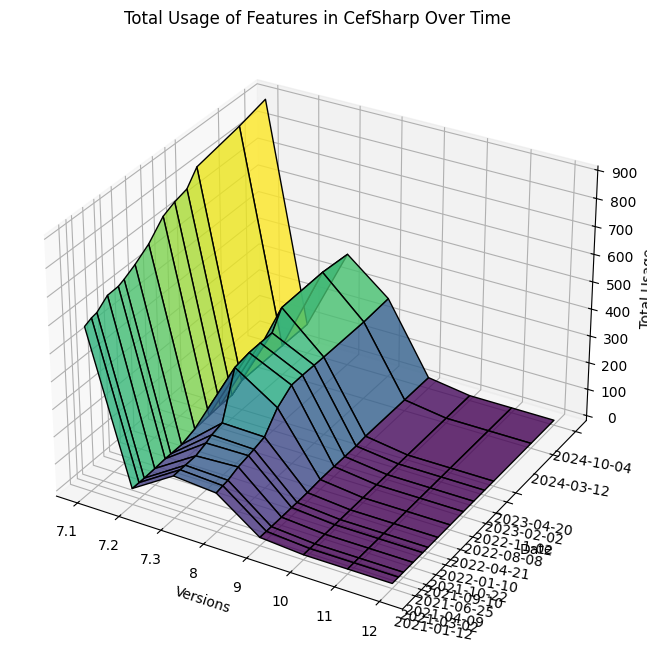

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


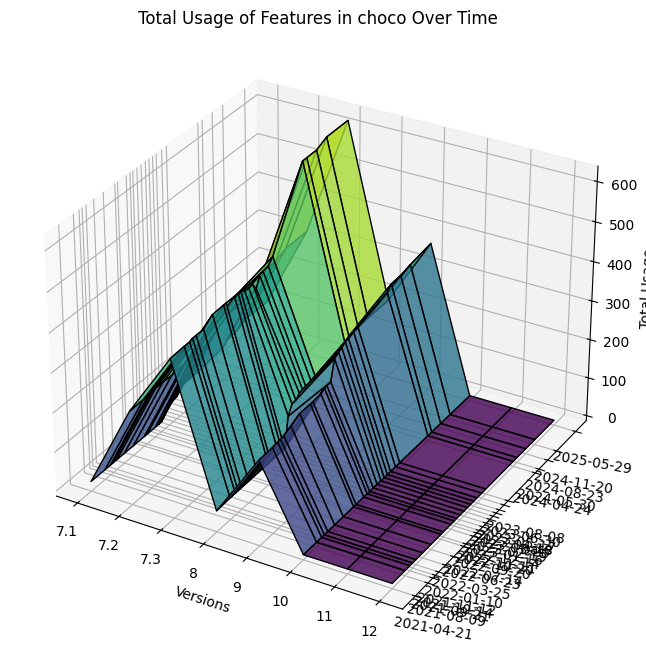

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


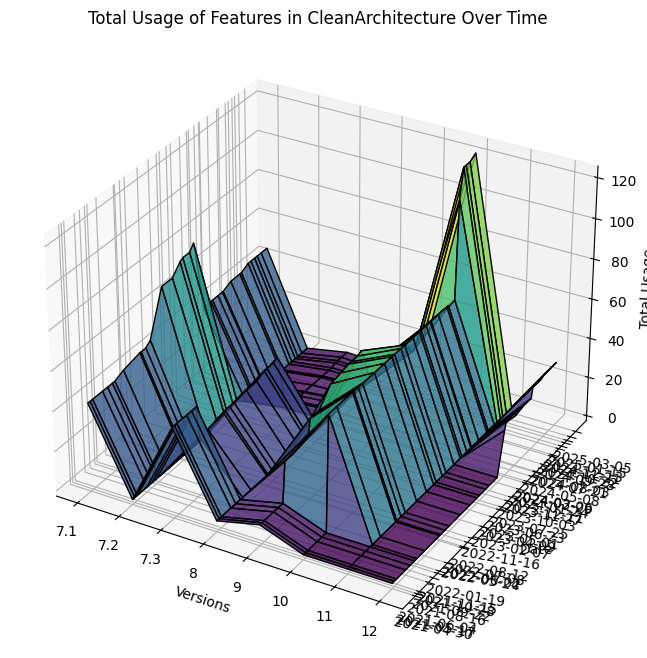

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


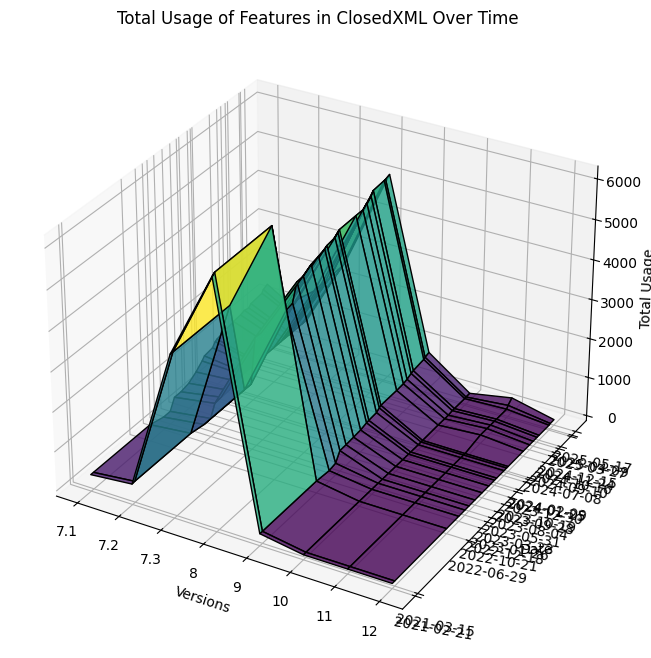

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


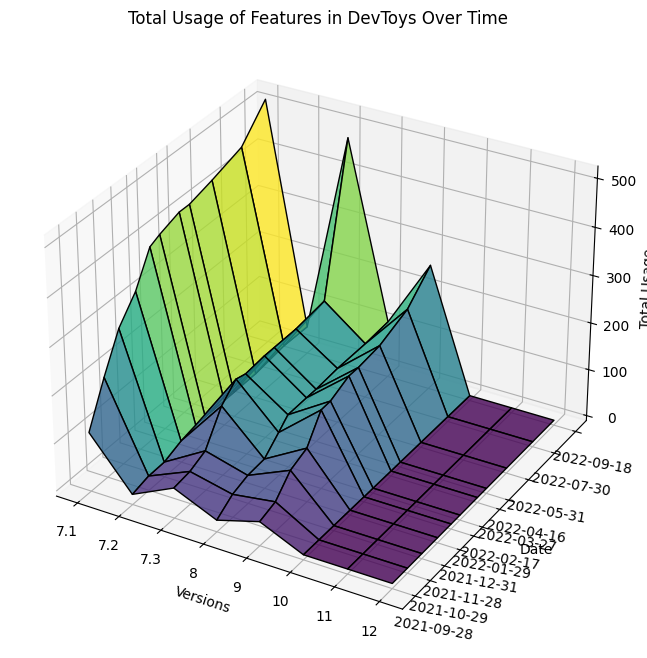

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())


           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


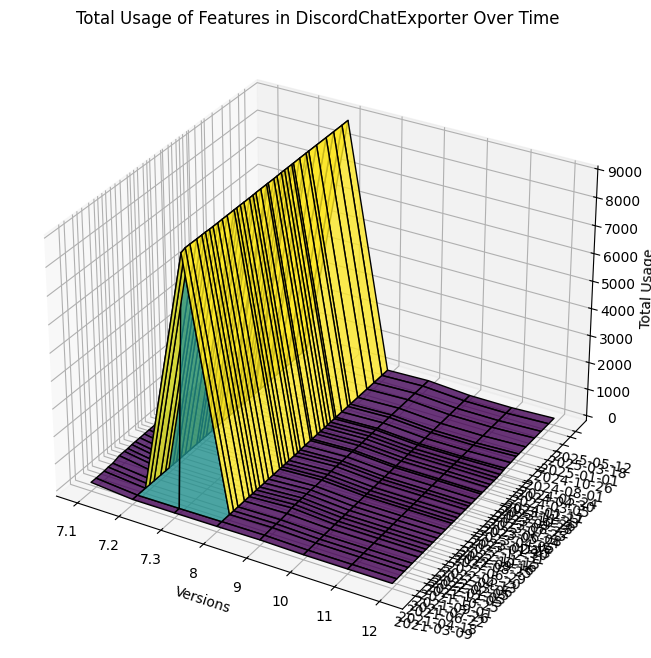

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


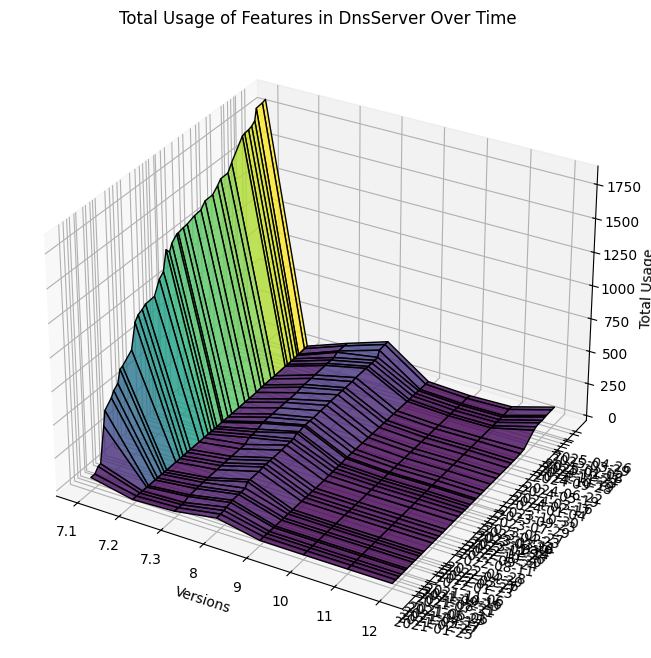

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


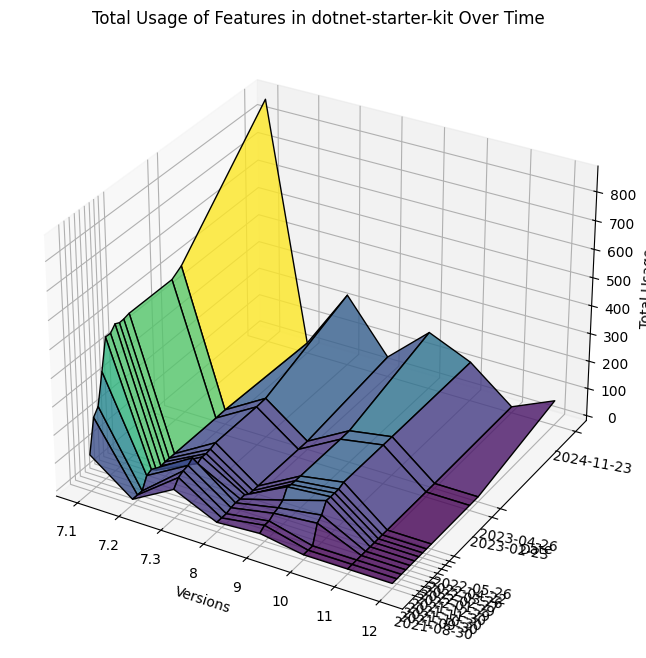

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


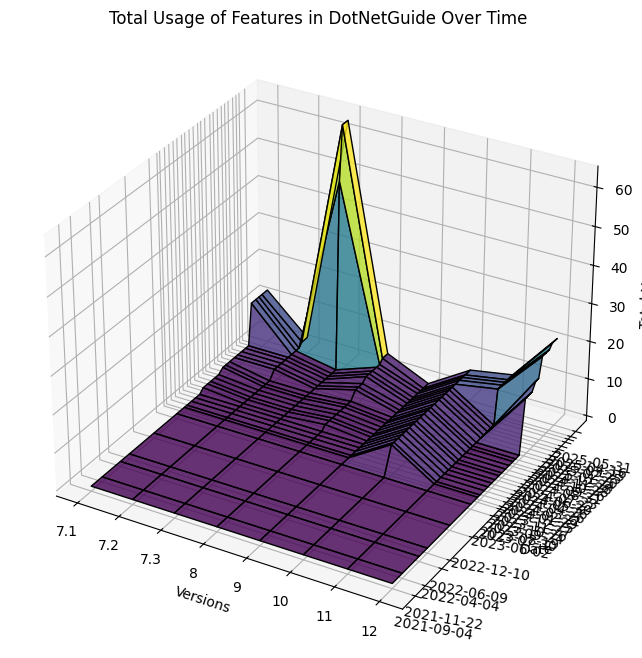

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


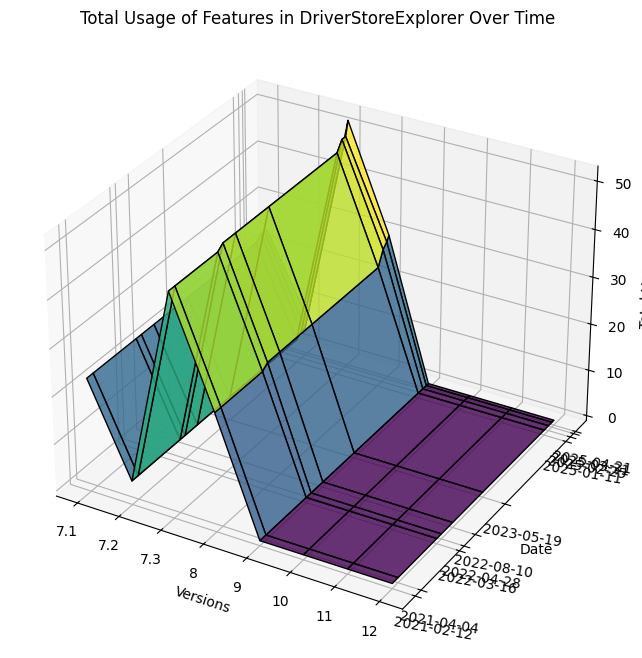

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


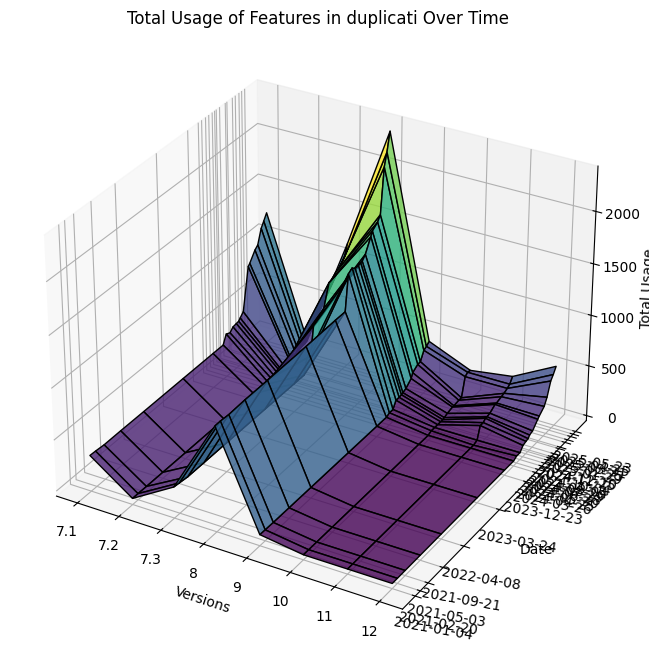

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


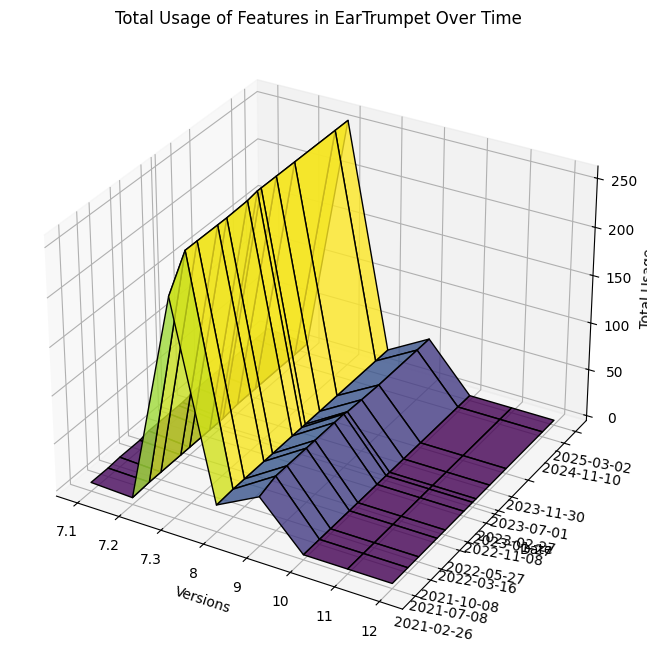

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


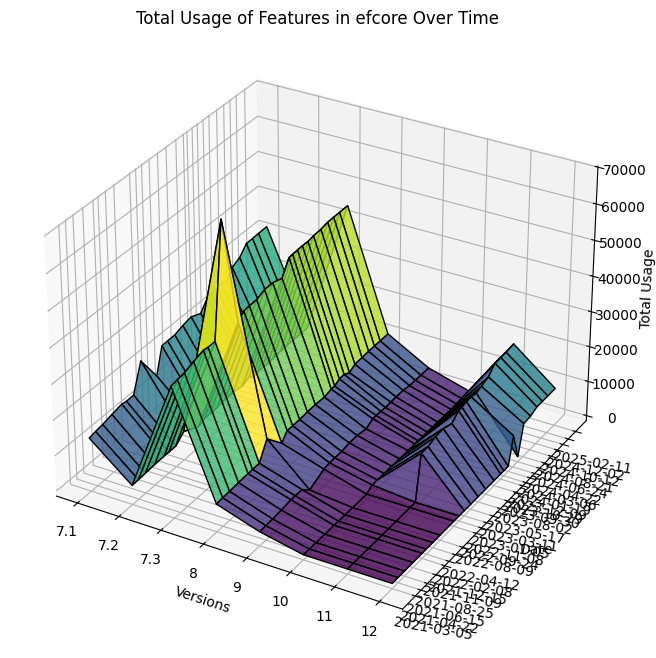

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


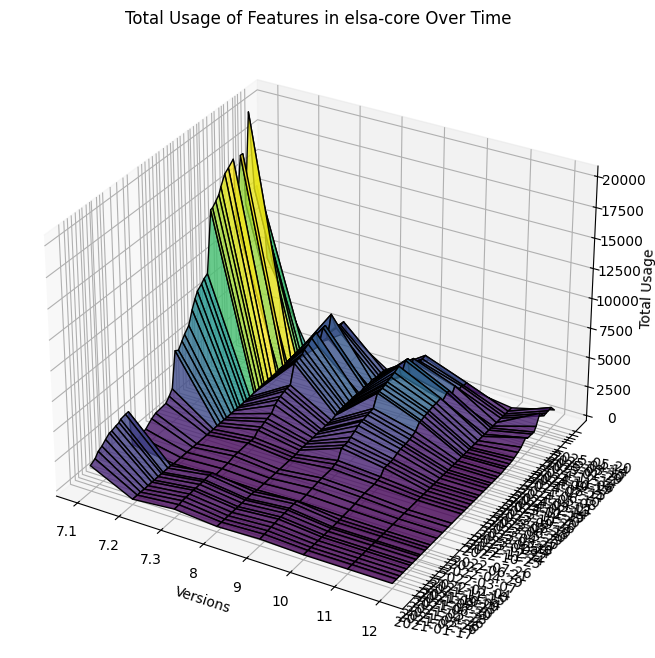

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())


           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


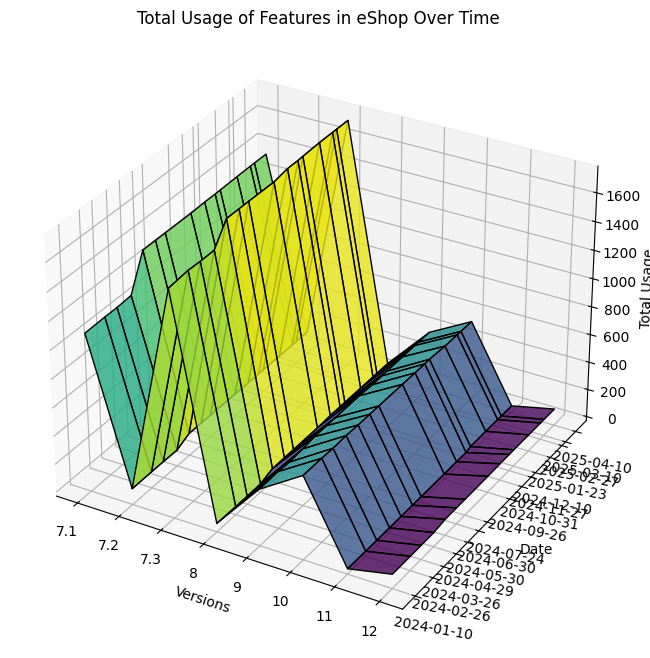

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


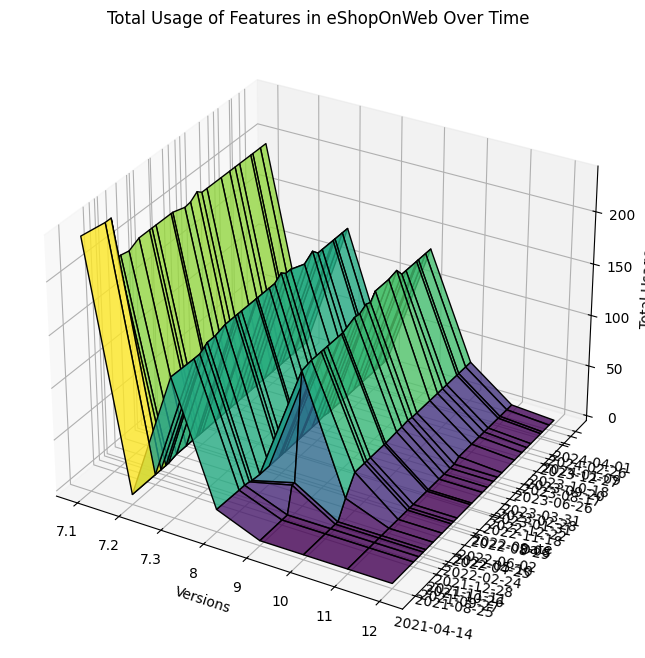

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


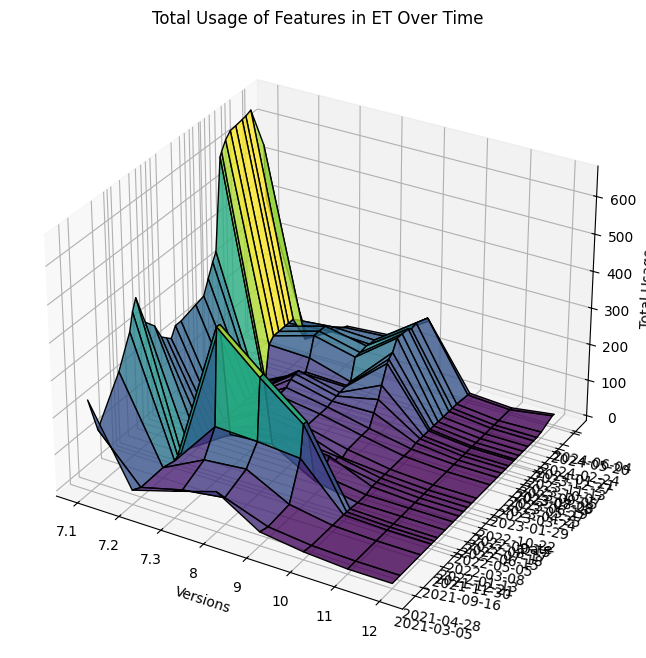

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


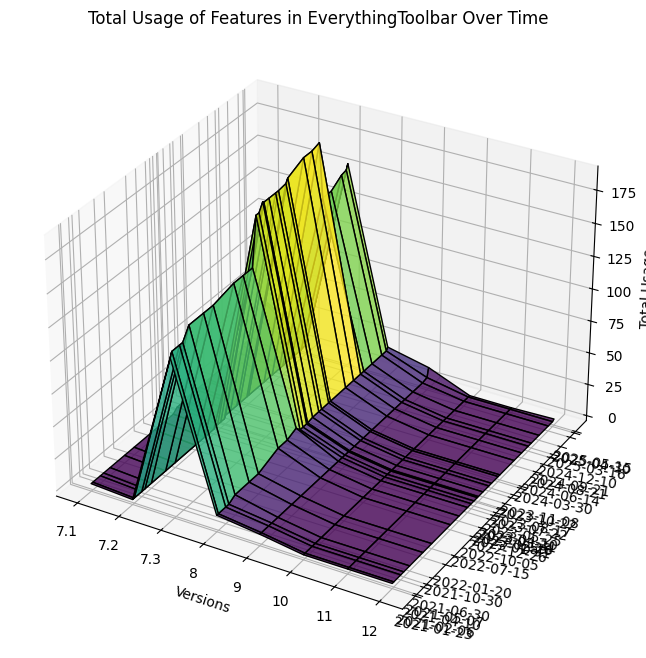

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


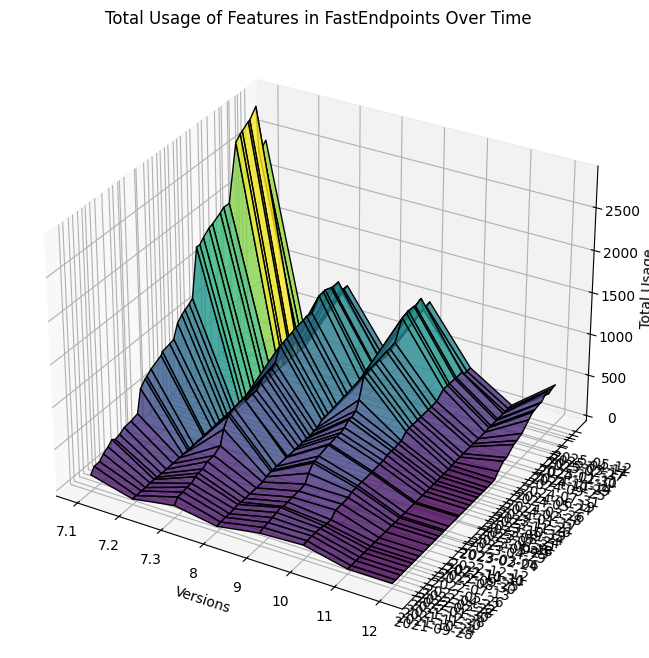

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


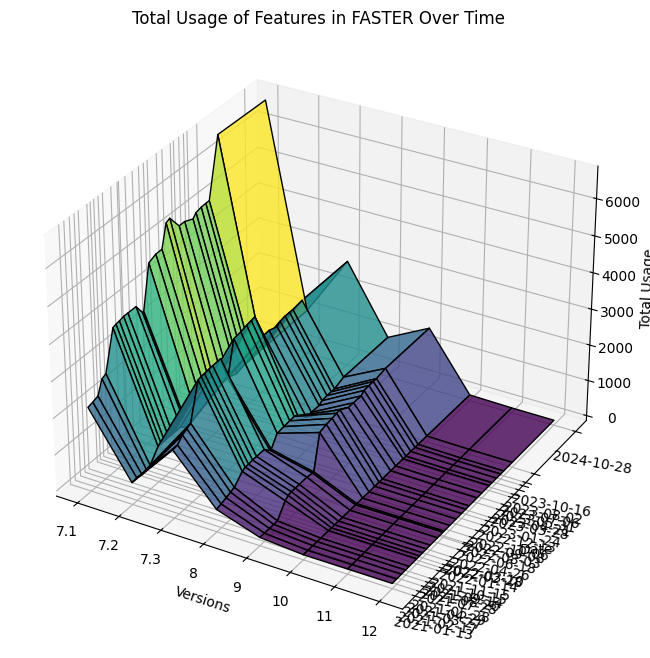

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


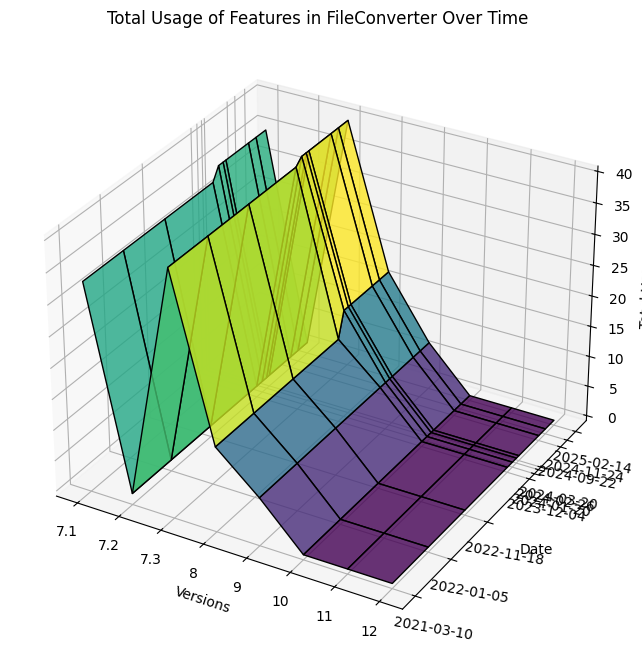

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())


           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


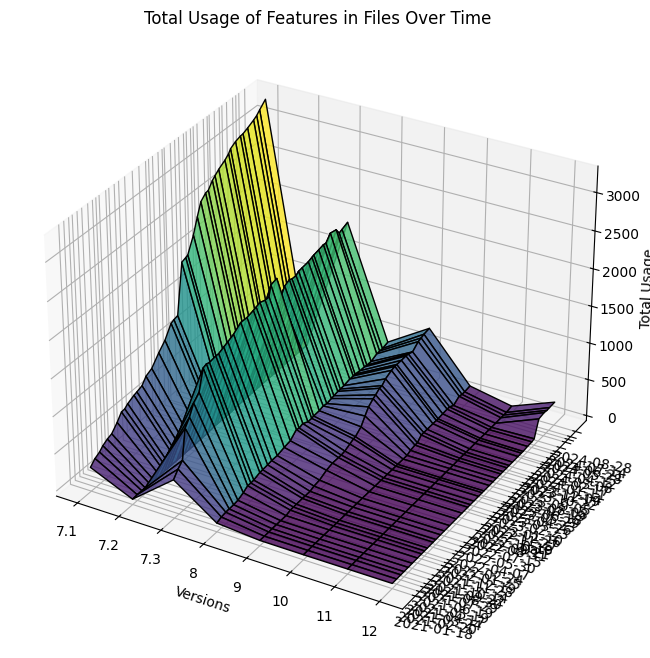

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


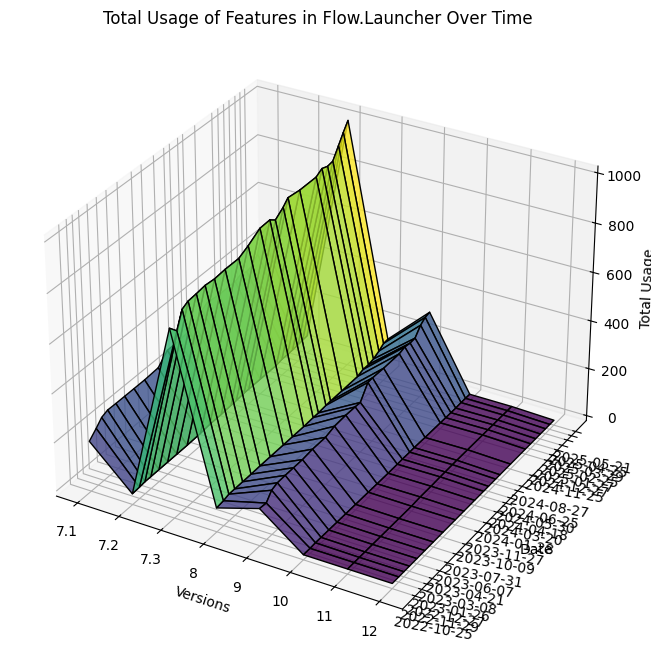

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


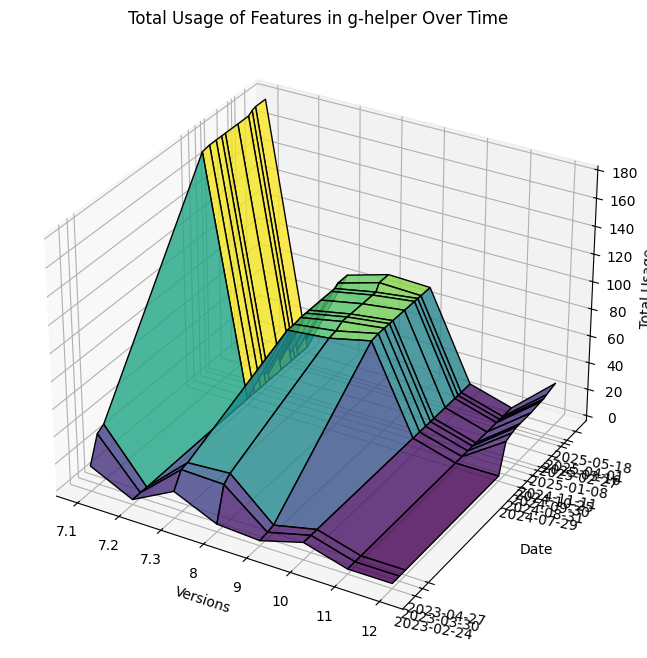

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


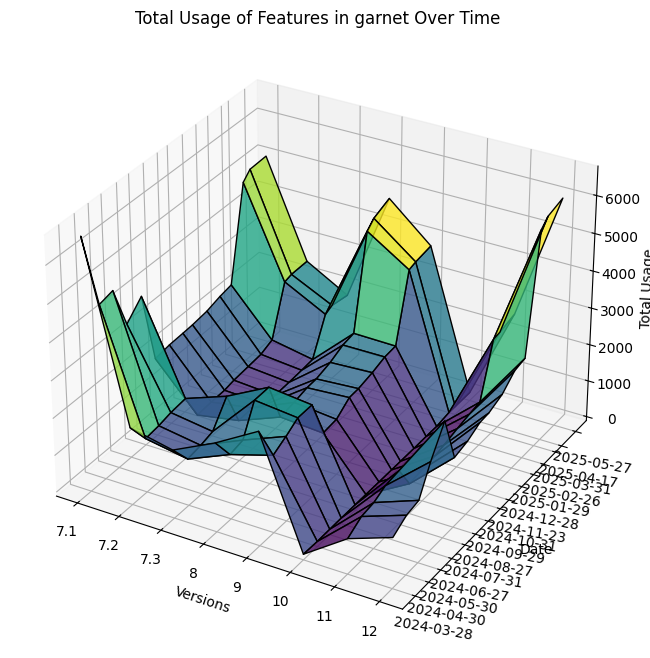

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


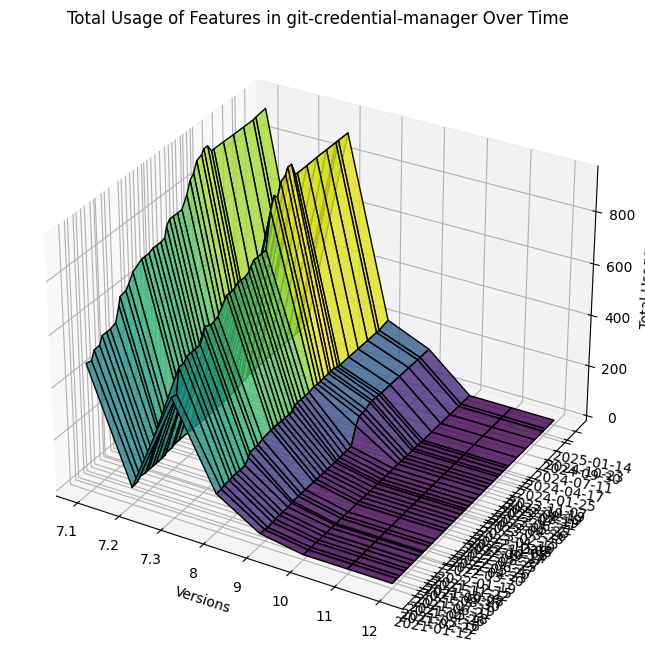

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


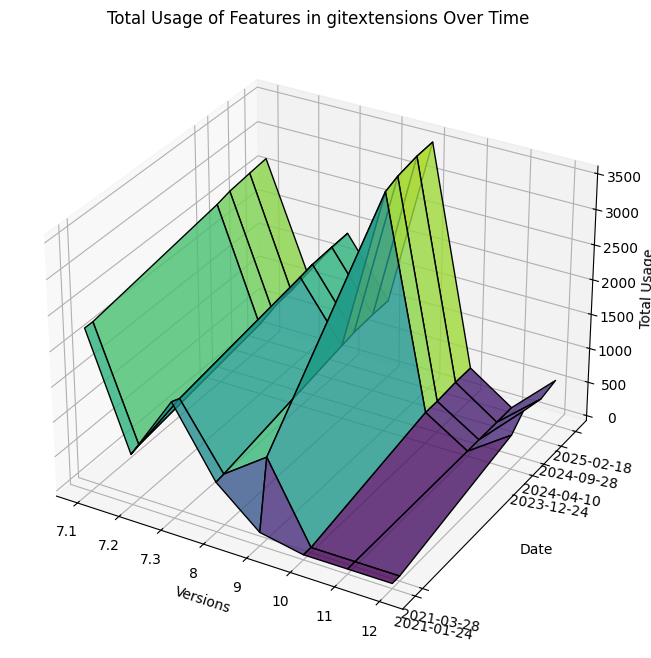

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


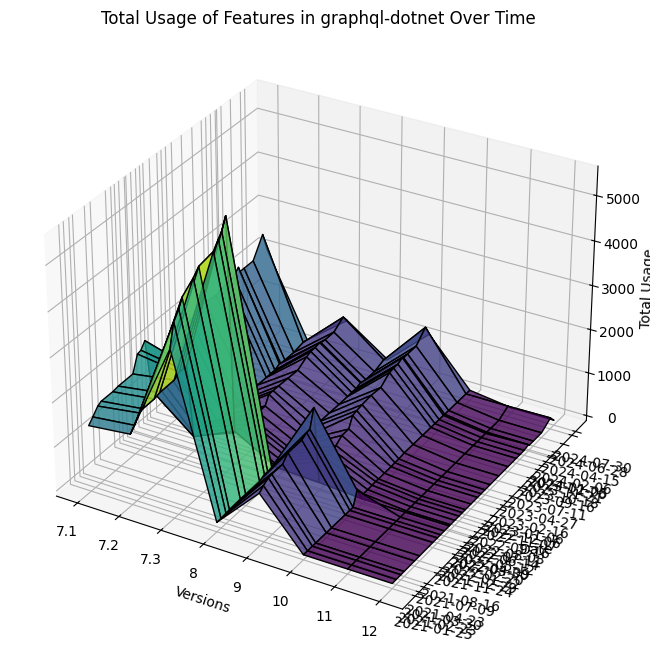

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


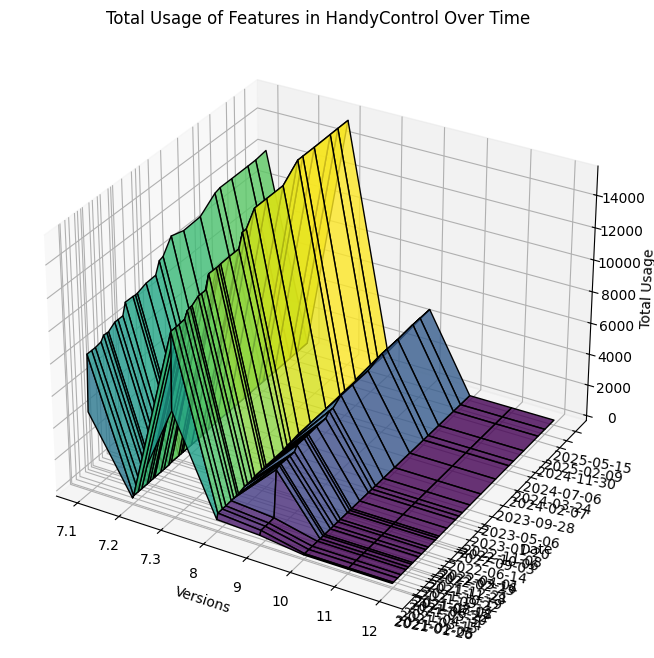

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


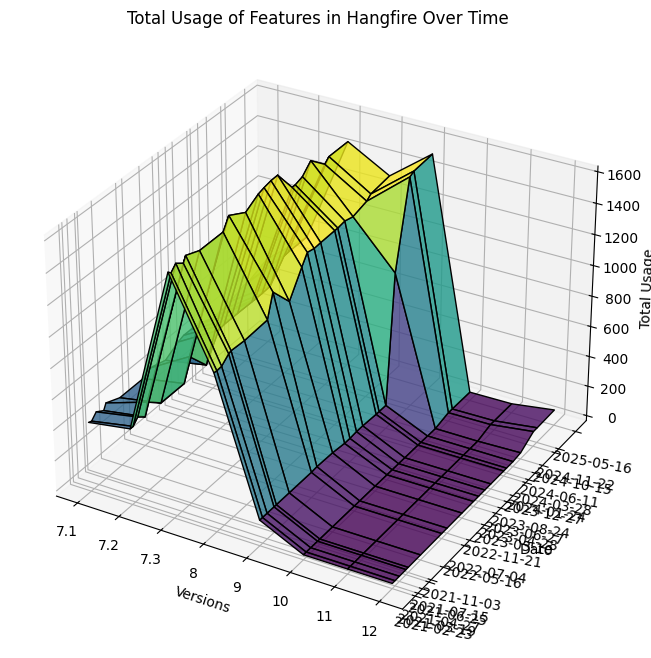

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


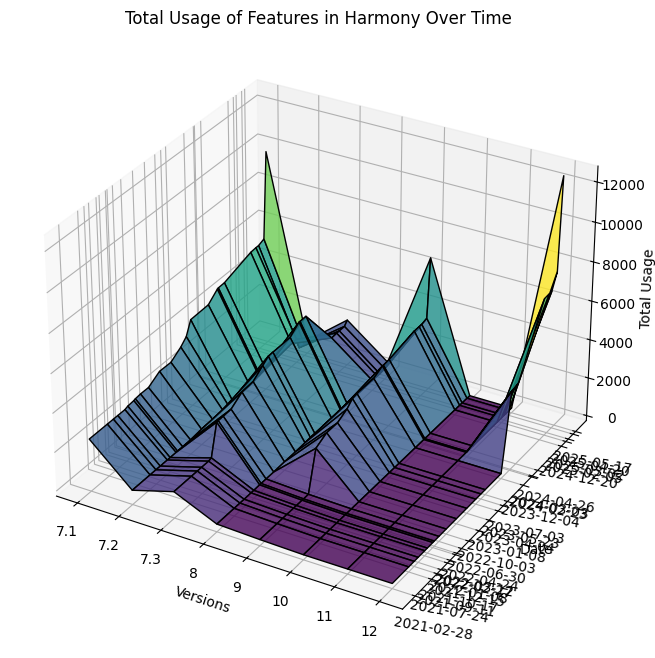

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


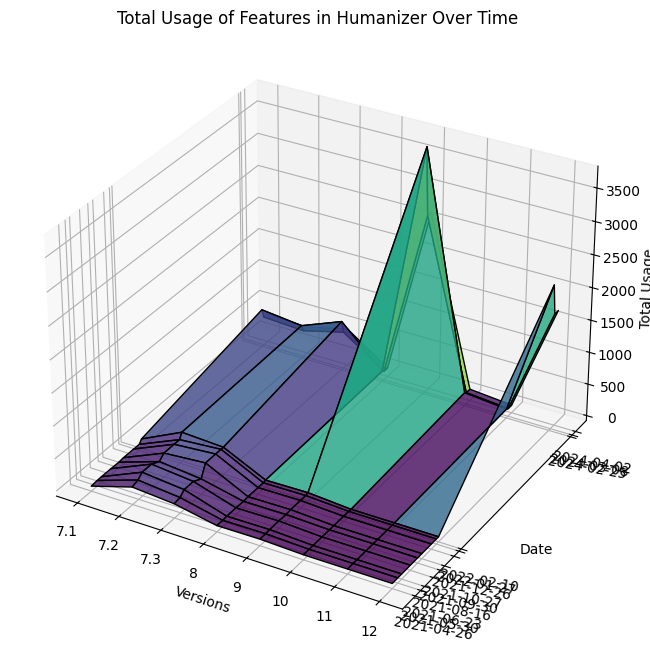

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


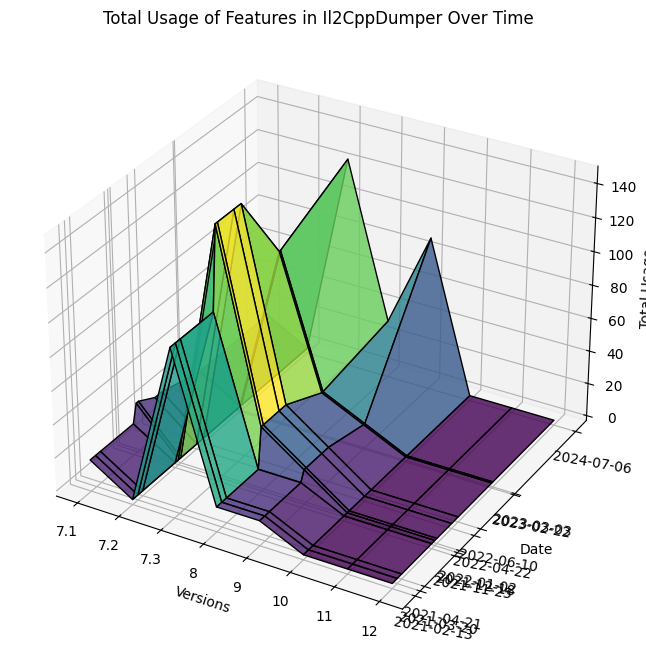

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


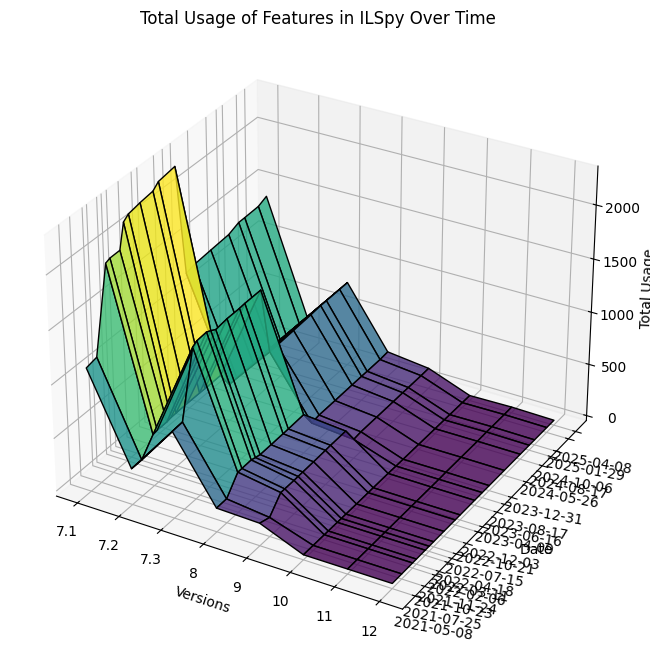

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


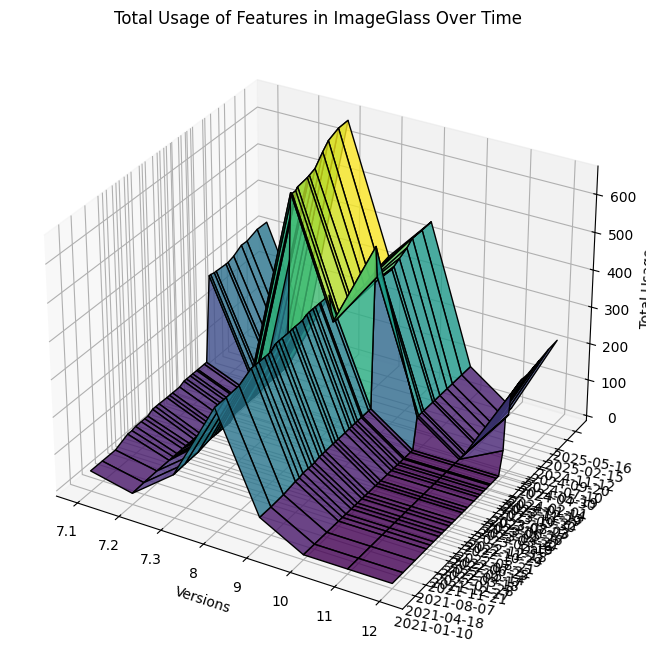

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


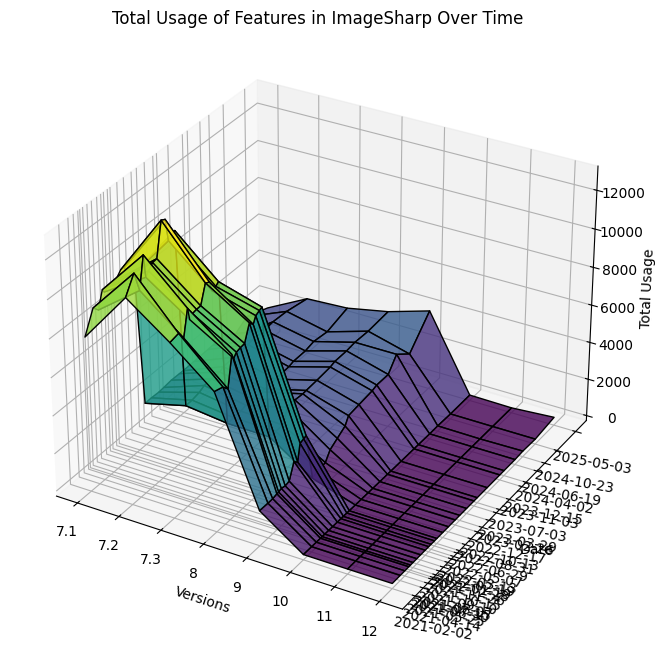

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


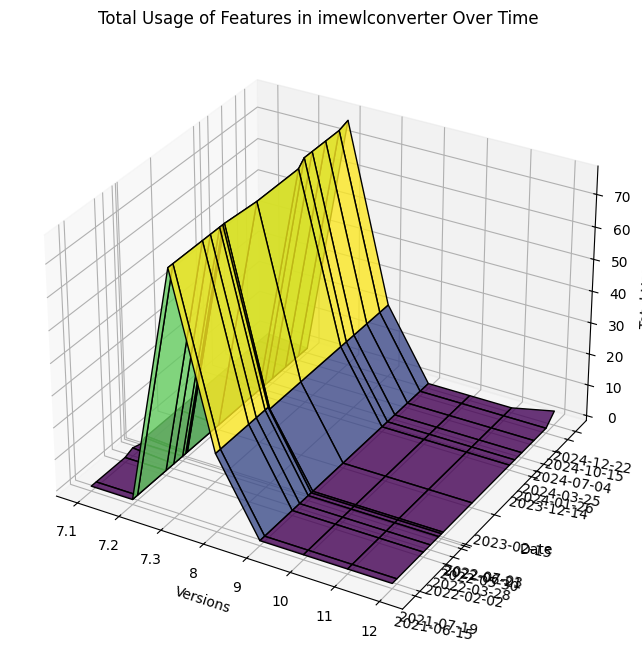

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


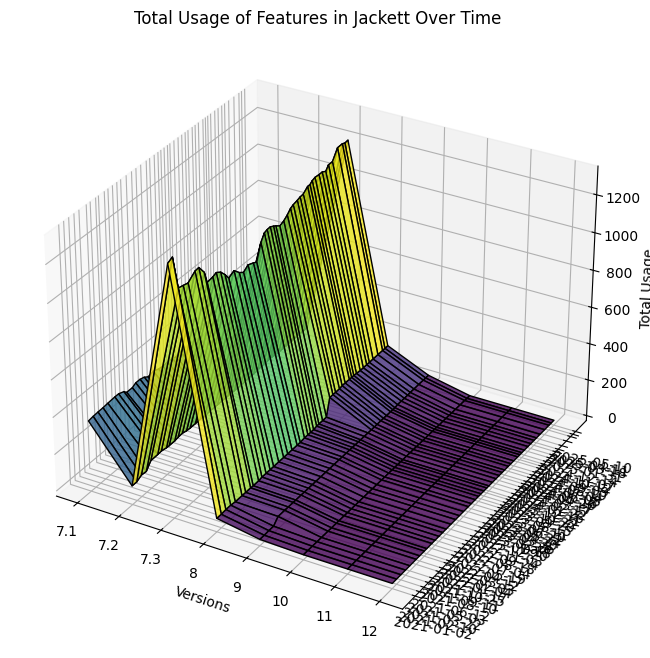

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


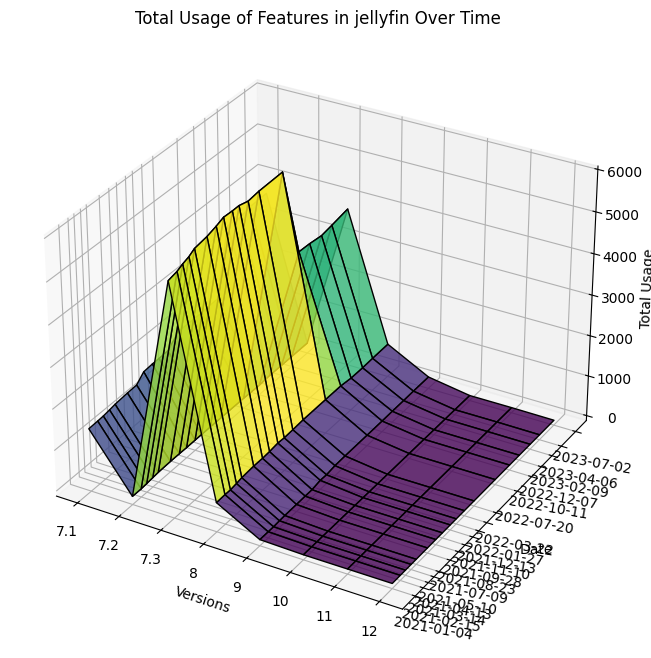

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


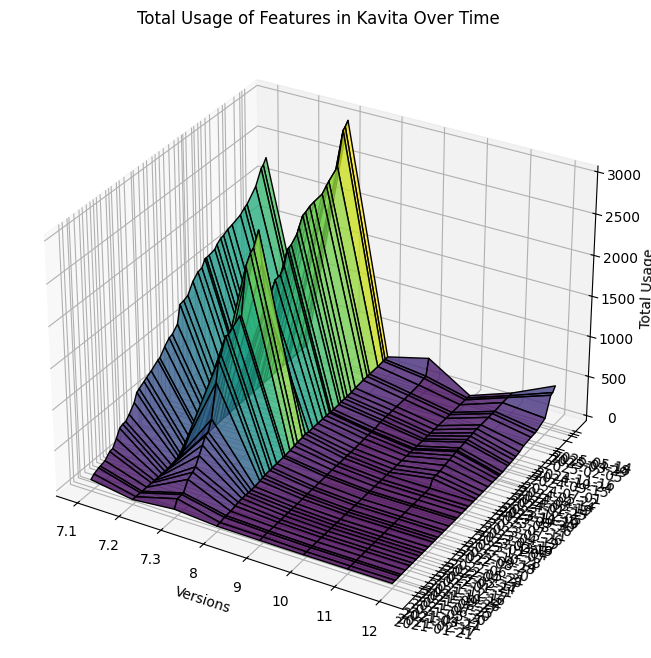

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())
C:\Users\sorin\AppData\Local\Temp\ipykernel_47760\869115553.py:43: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


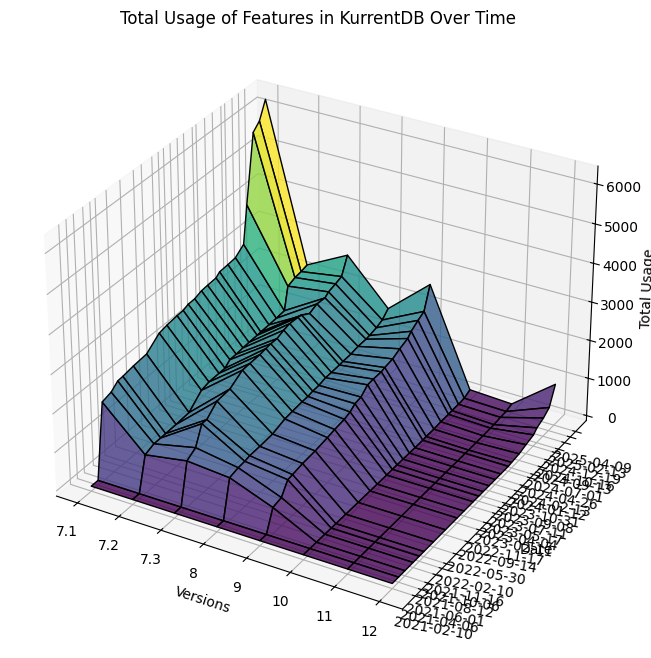

           Date               Repository    7.1   7.2   7.3     8     9  10  \
1793 2021-01-02             ServiceStack  11395   590  3900  1515   463   0   
1794 2021-01-02                  Jackett    356    75  1309    46     7   0   
1795 2021-01-04                duplicati    303    11   255   971    59   0   
1796 2021-01-04                   BBDown      9     0     1    24     4   0   
1797 2021-01-04           ArchiSteamFarm    768   176   124   206   846   0   
...         ...                      ...    ...   ...   ...   ...   ...  ..   
1888 2021-02-23  WindowsCommunityToolkit   2902  1190  4445   755  1315   0   
1889 2021-02-23                MudBlazor    377    49   195    32     6   0   
1890 2021-02-24                      uno   9840  2367  5769  2100   941   0   
1891 2021-02-25          BiliBiliToolPro     31     0    19    28     2   0   
1892 2021-02-26   Swashbuckle.AspNetCore    118    45   817    43     0   0   

      11  12 YearMonth  
1793   0   0   2021-01  
1

ValueError: Argument Z must be 2-dimensional.

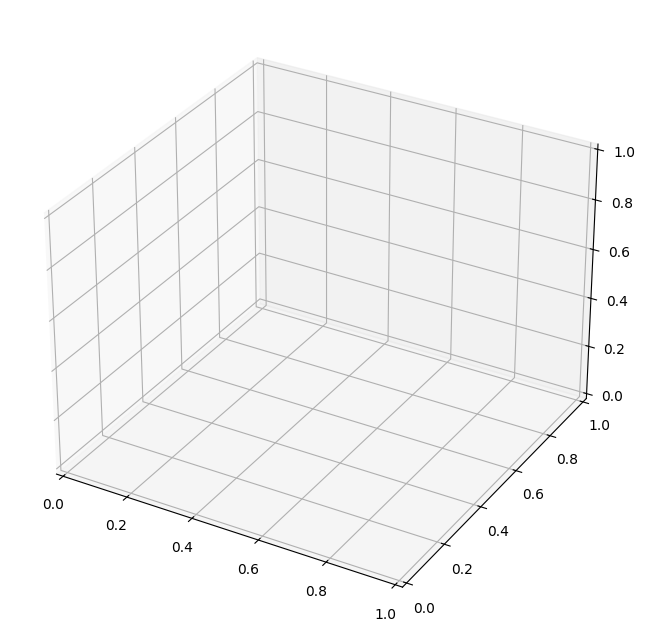

In [6]:
for repo_name in df["Repository"].unique():
    versions = [7.1, 7.2, 7.3, 8, 9, 10, 11, 12]

   

    df['Date'] = pd.to_datetime(df['Date'])
    df["YearMonth"] = df["Date"].dt.to_period("M")



    df_monthly = df.sort_values("Date").groupby(["Repository", "YearMonth"]).tail(1).reset_index(drop=True)
    df_monthly = df_monthly[df_monthly["Date"] >= "2021-01-01"]
    print(df_monthly.head(100))

    repo_df = df_monthly[df_monthly['Repository'] == repo_name]

    repo_df['Date_num'] = pd.to_datetime(repo_df['Date']).map(lambda d: d.toordinal())

    X,Y = np.meshgrid(range(len(versions)),repo_df["Date_num"])

    Z = np.array([repo_df[versions].iloc[i].values for i in range(len(repo_df))])


    fig = plt.figure(figsize=(12,8))

    ax = fig.add_subplot(111, projection='3d')

    ax.plot_surface(X, Y, Z, cmap ='viridis', edgecolor= 'k', alpha = 0.8)

    ax.set_xticks(range(len(versions)))

    ax.set_xticklabels(versions) #can add rotation=45 if needed
    ax.set_xlabel('Versions')

    ax.set_ylabel('Date')

    date_labels = pd.to_datetime(repo_df['Date']).dt.strftime('%Y-%m-%d').values

    ax.set_yticks(repo_df['Date_num'])
    ax.set_yticklabels(date_labels, rotation=-10)#can set ha ='right' for horizontal alignment
    ax.set_zlabel('Total Usage')
    ax.set_title(f"Total Usage of Features in {repo_name} Over Time")
    plt.tight_layout()
    plt.show()